In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime, timedelta
import requests, json
import matplotlib
from matplotlib import cm
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import os

In [19]:
class Sailboat():
    def __init__(self):
        self.data = None
        self.variable_to_column_name = {
                'o2 concentration': 'O2 Concentration [micromolar]',
                'o2 saturation': 'O2 Saturation [%]',
                'bb470': 'Bb(470) [NTU]',
                'bb532': 'Bb(532) [NTU]',
                'bb650': 'Bb(650) [NTU]',
                'cdom': 'CDOM [QSU]',
                'chla': 'Chl. a [ppb]',
                'phycocyanin': 'Phycocyanin [ppb]' 
            }
        self.color = None
    
    def api_download(self, date_interval, variables):
        """
        Download sailboat dataset with the given date interval and variables 
        """
        self.data = None 
        
    def str_to_float(self, variable):
        variable_column = self.variable_to_column_name[variable]
        self.data[variable_column].replace(',', np.nan, inplace=True)
        self.data[variable_column] = list(map(lambda x: float(x),
                                             self.data[variable_column]))
    
    def plot(self, x_variable, y_variable,
            xlim=None, ylim=None, x_fontsize=20, y_fontsize=20, p_size=5, 
             jet_convert=False, show_z=False, z='bb470', vmin=0, vmax=200, ax = None):
                
        if ax is None:
            fig = plt.figure(figsize=(10, 10))
            ax = plt.axes(projection=request.crs)
            
        self.str_to_float(x_variable)
        self.str_to_float(y_variable)
        x_column = self.variable_to_column_name[x_variable]
        y_column = self.variable_to_column_name[y_variable]
            
        if jet_convert:
            for bb in ['bb470', 'bb532', 'bb650']:
                self.str_to_float(bb)
                
            three_color_bb = np.array(self.data[['Bb(650) [NTU]', 'Bb(532) [NTU]', 'Bb(470) [NTU]']])
            row_sum = np.sum(three_color_bb, axis=1).reshape(len(three_color_bb),1)
            three_color_bb = three_color_bb/row_sum
            red = three_color_bb[:, 0]
            blue = three_color_bb[:, 2]
            scheme_percent = 0.5 + red*0.5 - blue*0.5
            self.color = [cm.jet(x) for x in scheme_percent]
            ax.scatter(self.data[x_column], self.data[y_column], s=p_size,
                        c=self.color, alpha=0.5)
        #else:
        #    plt.scatter(self.data[x_column], self.data[y_column], s=p_size)
        
        if show_z: 
            self.str_to_float(z)
            z_column_name = self.variable_to_column_name[z]
            self.color = self.data[z_column_name]
#             plt.figure(figsize=(12,10))
            ax.scatter(self.data[x_column], self.data[y_column], s=p_size,
                c=self.color, alpha=0.5, vmin=vmin, vmax=vmax, cmap='jet')
            fig.colorbar(label=z_column_name)
        else:
#             plt.figure(figsize=(10,10))
            ax.scatter(self.data[x_column], self.data[y_column], s=p_size)
            
        ax.set_xlabel(x_column, fontsize=x_fontsize)
        ax.set_ylabel(y_column, fontsize=y_fontsize)
        if xlim != None:
            ax.set_xlim(xlim)
        if ylim != None:
            ax.set_ylim(ylim)
#         plt.show()
        
    def background(self, extent = [-81.15, -80.51,26.65, 27.24], ax=None, 
                  request = cimgt.GoogleTiles(style='satellite'),
                 out = False):
        
        if ax is None:
            fig = plt.figure(figsize=(10, 10))
            ax = plt.axes(projection=request.crs)
        gl = ax.gridlines(draw_labels=True, alpha=0.2)
        gl.xlabels_top = gl.ylabels_right = False
        gl.xformatter = LONGITUDE_FORMATTER
        gl.yformatter = LATITUDE_FORMATTER

        ax.set_extent(extent)

        if request:
            ax.add_image(request, 10)
        if out is True:
            return fig, ax

    def plot_path(self, var, start_date, end_date, s=10, vmax=120, out=False, ax=None, fig=None):
        self.str_to_float(var)
        if ax is None:
            fig = plt.figure(figsize=(10, 10))
            ax = plt.axes(projection=cimgt.GoogleTiles(style='satellite').crs)
            self.background(ax=ax)
            
        var_column_name = self.variable_to_column_name[var]
        start_date_val = datetime.strptime(start_date, '%Y-%m-%d')
        end_date_val = datetime.strptime(end_date, '%Y-%m-%d')
        select_rows = (self.data['GPSTimeStamp']>=start_date_val)&(self.data['GPSTimeStamp']<=end_date_val)
        df = self.data.loc[select_rows, :]
        mask = (df['Lon']<-10) & (df['Lat']>10)
        mapp = ax.scatter(df['Lon'].loc[mask], df['Lat'].loc[mask],
                          c=df[var_column_name].loc[mask], s=s, transform=ccrs.PlateCarree(),
                         vmin=0, vmax=vmax)
        ax.set_title(f'From {start_date} to {end_date}', fontsize=20)
        fig.colorbar(mapp, label=var_column_name)
        if out:
            return fig, ax
        
    def plot_path_2(self, var, start_date, end_date, s=10):
        plt.figure(figsize=(10, 10))
        #ax = plt.axes(projection=cimgt.GoogleTiles(style='satellite').crs)
        start_date = datetime.strptime(start_date, '%Y-%m-%d')
        end_date = datetime.strptime(end_date, '%Y-%m-%d')
        select_rows = (self.data['GPSTimeStamp']>=start_date)&(self.data['GPSTimeStamp']<=end_date)
        df = self.data.loc[select_rows, :]
        df['Lon'][df['Lon']>-10] = np.nan
        df['Lat'][df['Lat']<10] = np.nan
        var_column_name = self.variable_to_column_name[var]
        plt.scatter(df['Lon'], df['Lat'], s=s)
        
    def clean_date(self):
        self.data['GPSTimeStamp'].replace('0000-00-00 00:00:00', '1900-01-01 12:12:12', inplace=True)
        array = []
        for x in self.data['GPSTimeStamp']:
            try:
                datetime.strptime(x, '%Y-%m-%d %H:%M:%S')
                array.append(datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))
            except ValueError:
                array.append(datetime.strptime('1900-01-01 12:12:12', '%Y-%m-%d %H:%M:%S'))
        self.data['GPSTimeStamp'] = array       
        self.data.sort_values(by='GPSTimeStamp', inplace=True)

In [3]:
all_df = []
for filename in os.listdir('Data'):
    if filename[0] != '.':
        df = pd.read_csv(f"Data/{filename}", sep=', ')
        all_df.append(df)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  after removing the cwd from sys.path.


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:98: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


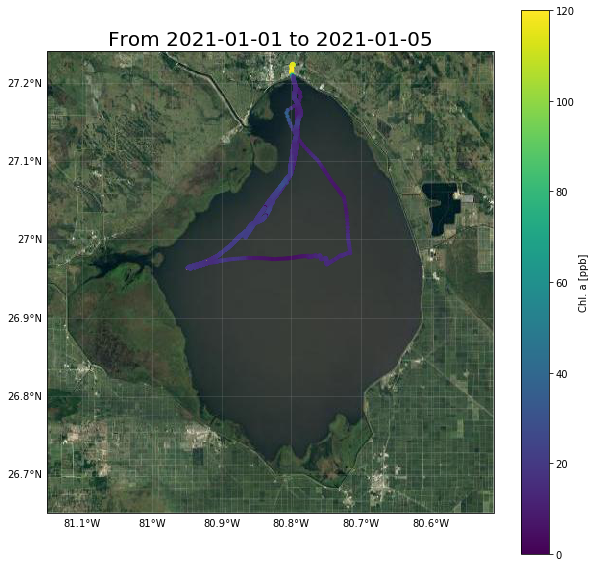

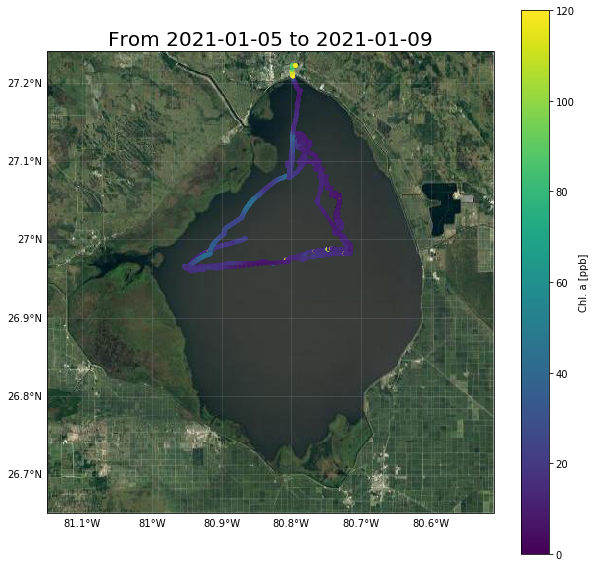

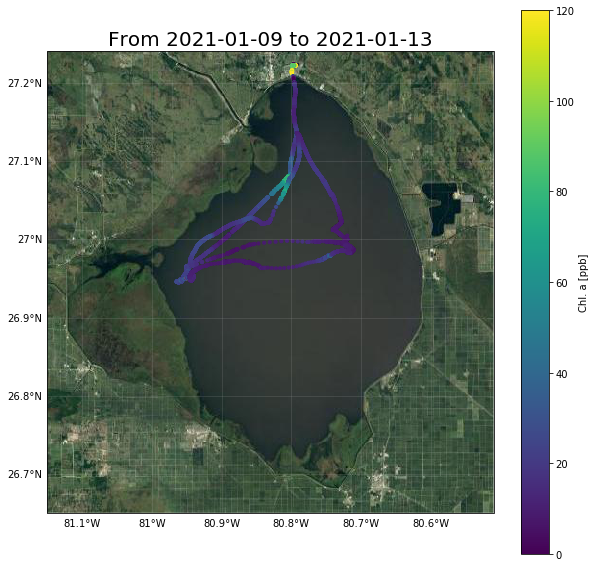

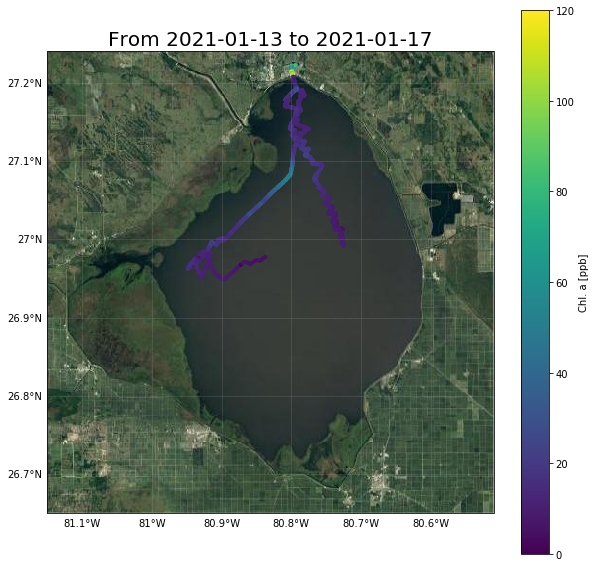

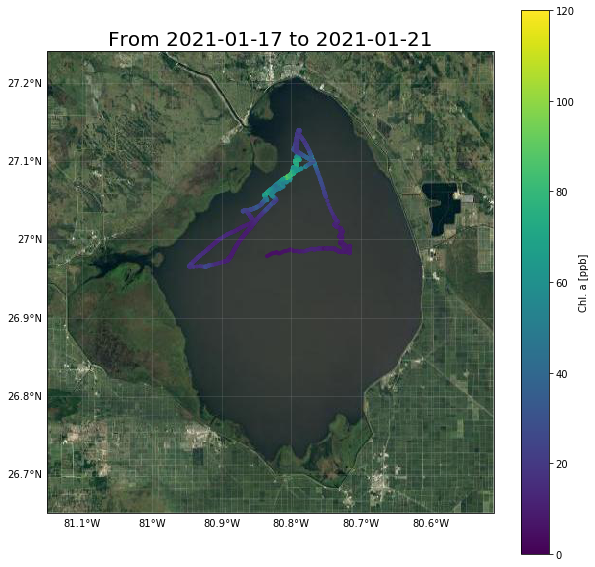

...

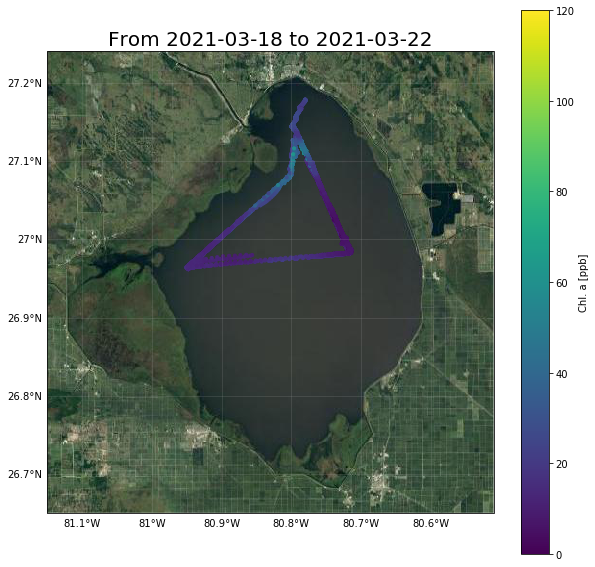

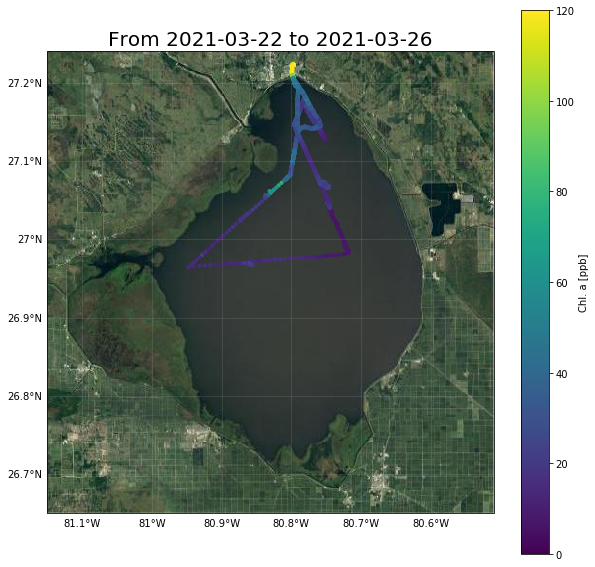

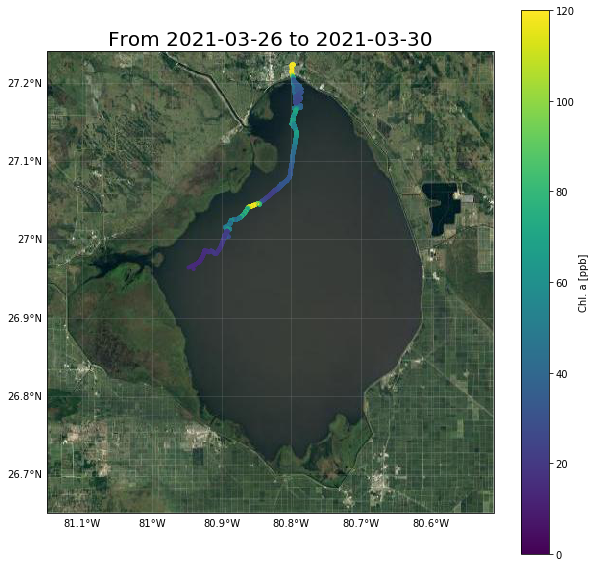

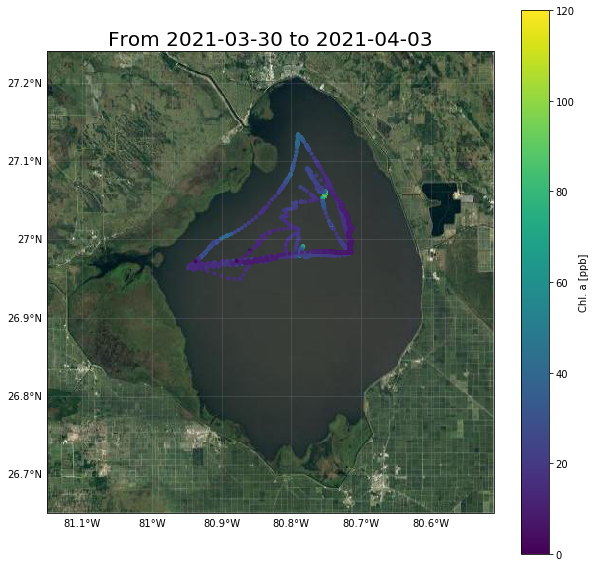

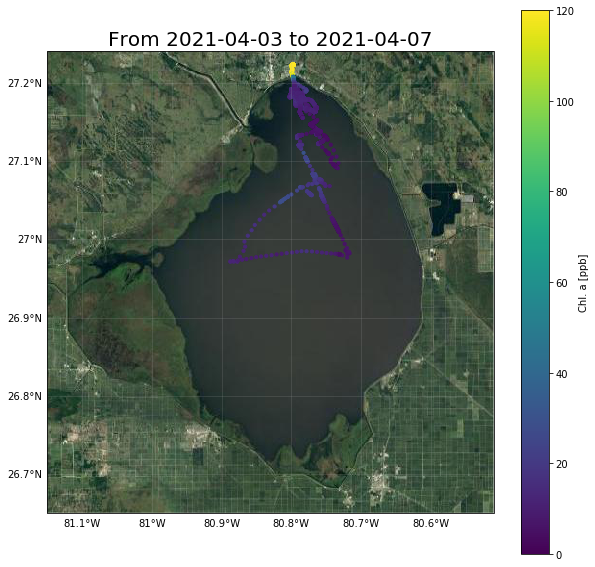

In [10]:
sailboat = Sailboat()
sailboat.data = pd.concat(all_df, ignore_index=True)
sailboat.clean_date()

x = datetime(2021,1,1)
delta = timedelta(days=4) #time range of a lap

while x < datetime(2021,4,6):
    start_date = x.strftime("%Y-%m-%d")
    end_date = (x+delta).strftime("%Y-%m-%d")
    sailboat.plot_path(var='chla', start_date=start_date, end_date=end_date)
    x += delta

In [12]:
from celluloid import Camera

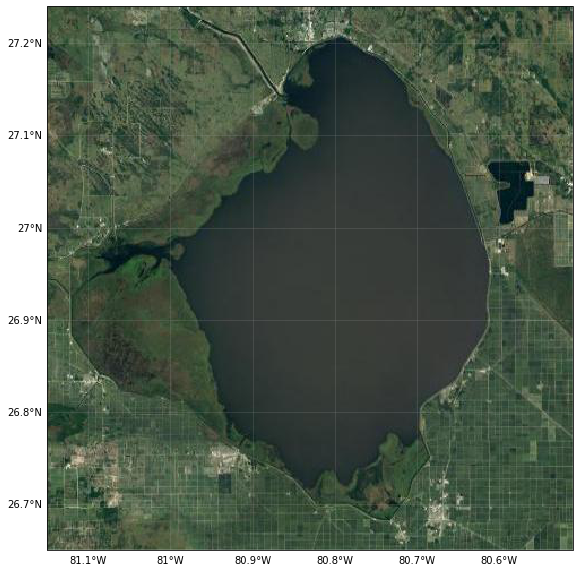

In [25]:
fig, ax = sailboat.background(ax=None, out=True)
camera = Camera(fig)
while x < datetime(2021,4,6):
    start_date = x.strftime("%Y-%m-%d")
    end_date = (x+delta).strftime("%Y-%m-%d")
    sailboat.plot_path(var='chla', start_date=start_date, end_date=end_date, 
                       ax=ax, fig=fig)
    camera.snap()
    x += delta
animation = camera.animate()

In [14]:
from matplotlib.animation import FuncAnimation
fig, ax = sailboat.backgroud(out=True)
#fig = plt.figure()
#ax = plt.axes(xlim=(-81.15,-80.51), ylim=(26.65, 27.24))
line, = ax.plot([], [], lw=3)

def init():
    line.set_data([], [])
    return line,

def animate(i):
    x = np.linspace(0, 4, 1000)
    y = np.sin(2 * np.pi * (x - 0.01 * i))
    line.set_data(x, y)
    return line,

anim = FuncAnimation(fig, animate, init_func=init,
                               frames=200, interval=20, blit=True)


anim.save('sine_wave.gif', writer='imagemagick')

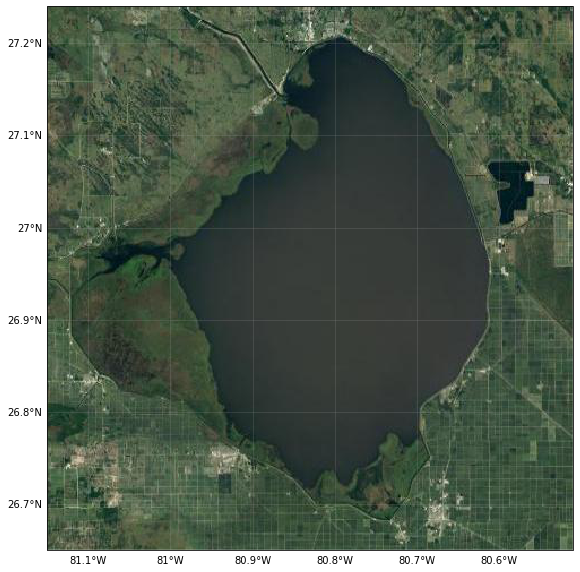

In [21]:
fig, ax = sailboat.background(out=True)